In [1]:
import pandas as pd
import numpy as np
from src.utils import setup_folders, return_static_features, return_dynamic_features
from src.visualization.evaluate import calculate_metric_horizons, calculate_metric_horizon_windows, calculate_metric_horizons_all_models
from src.visualization.visualize import plot_horizons, plot_scatterplot, plot_test_day, plot_mean_std_error_multiple_models, plot_ridges_multiple_models, plot_violins_multiple_models
from src.features.build_features import build_features, build_features_LSTM
import seaborn as sns

In [2]:
plant = "HPP3"
path_out_data_processing = f"../reports/results/{plant}/deterministic/data_processing"
setup_folders(path_out_data_processing)
path_out_predictions = f"../reports/results/{plant}/deterministic/predictions"
setup_folders(path_out_predictions)

# We load observations + meteo

In [3]:
### We load the data
if plant == "Nazeerabad":
    # Load the data
    path = "../data/processed/Nazeerabad/Nazeerabad_OBS_METEO_30min_precleaned.csv"
    df = pd.read_csv(path, sep = ";", parse_dates = True, index_col = [0])
elif plant == "HPP1":
    path = "../data/processed/HPP1/HPP1_OBS_METEO_30min.csv"
    df = pd.read_csv(path, sep = ";", parse_dates = True, index_col = [0])
elif plant == "HPP2":
    path = "../data/processed/HPP2/HPP2_OBS_METEO_15min.csv"
    df = pd.read_csv(path, sep = ";", parse_dates = True, index_col = [0])
elif plant == "HPP3":
    path = "../data/processed/HPP3/HPP3_OBS_METEO_30min.csv"
    df = pd.read_csv(path, sep = ";", parse_dates = True, index_col = [0])

In [4]:
df.max()

obs_power_solar         0.999619
obs_power_wind          0.999711
obs_power_agr           0.925761
ModelRun                1.000000
WINDSPEED_100m          1.000000
WINDDIR_100m            1.000000
WINDSPEED_10m           1.000000
WINDDIR_10m             1.000000
ModelRun.1              1.000000
DSWRF                   1.000000
Tmp_2m_C                1.000000
TCDC                    1.000000
hour                    1.000000
day                     1.000000
month                   1.000000
obs_power_wind_lag1     0.999711
obs_power_solar_lag1    1.648338
obs_power_agr_lag1      1.246505
dtype: float64

# We build features

In [5]:
tech = "agr"
features, targets, meteo_features, obs_features = return_dynamic_features(plant, tech)
### We prepare the static features
#dt_train, dt_test, X_train, X_test, Y_train, Y_test, features = build_features(df, features, targets)
#print(dt_train.shape, dt_test.shape, X_train.shape, X_test.shape, Y_train.shape, Y_test.shape)

# We load predictions

In [6]:
# We load the predictions
tech = "agr"
filename = f'../reports/results/{plant}/deterministic/predictions/{plant}_{tech}_predictions_tuned.csv'
df_preds_agr = pd.read_csv(filename, sep=";", index_col = [0], parse_dates=[0])

tech = "wind"
filename = f'../reports/results/{plant}/deterministic/predictions/{plant}_{tech}_predictions_tuned.csv'
df_preds_wind = pd.read_csv(filename, sep=";", index_col = [0], parse_dates=[0])

tech = "solar"
filename = f'../reports/results/{plant}/deterministic/predictions/{plant}_{tech}_predictions_tuned.csv'
df_preds_solar = pd.read_csv(filename, sep=";", index_col = [0], parse_dates=[0])

In [7]:
if plant in ["Nazeerabad", "HPP1", "HPP2", "HPP3"]:
    wind_cap = 1
    solar_cap = 1
agr_cap = wind_cap + solar_cap

# We aggregate the individual predictions
df_preds_agr_sum = (df_preds_wind*wind_cap + df_preds_solar*solar_cap) / (agr_cap)
df_preds_agr_sum['Horizon'] = df_preds_agr['Horizon']

In [8]:
# we drop the LSTM recursive
df_preds_wind = df_preds_wind.drop(['Y_pred_LSTM(recursive)'], axis=1)
df_preds_solar = df_preds_solar.drop(['Y_pred_LSTM(recursive)'], axis=1)
df_preds_agr = df_preds_agr.drop(['Y_pred_LSTM(recursive)'], axis=1)
df_preds_agr_sum = df_preds_agr_sum.drop(['Y_pred_LSTM(recursive)'], axis=1)

In [9]:
# We set all predictions below 0 to 0
df_preds_wind[df_preds_wind < 0] = 0
df_preds_solar[df_preds_solar < 0] = 0
df_preds_agr[df_preds_agr < 0] = 0
df_preds_agr_sum[df_preds_agr_sum < 0] = 0

# Available data

In [10]:
fig_available = df.plot(y = ['obs_power_wind', 'obs_power_solar'])
fig_available.update_layout(title=f"", xaxis_title="Date", yaxis_title="Power (MW)")
fig_available.update_layout(legend_title="Time series", font=dict(family="Arial",size=22))
if plant in ['HPP2', 'Nazeerabad']:
    fig_available.update_layout(legend=dict(orientation="h", yanchor="top", y=-0.25, xanchor="left", x=0.01))
else:
    fig_available.update_layout(legend=dict(orientation="h", yanchor="top", y=-0.15, xanchor="left", x=0.01))
fig_available.update_layout(xaxis_showgrid=False, yaxis_showgrid=False)
fig_available.write_image(f"{path_out_data_processing}/{plant}_cleaned_data.pdf", width=720, height=720)
fig_available.show()

# Pairplot of target obs + meteo

In [11]:
df.shape

(35615, 18)

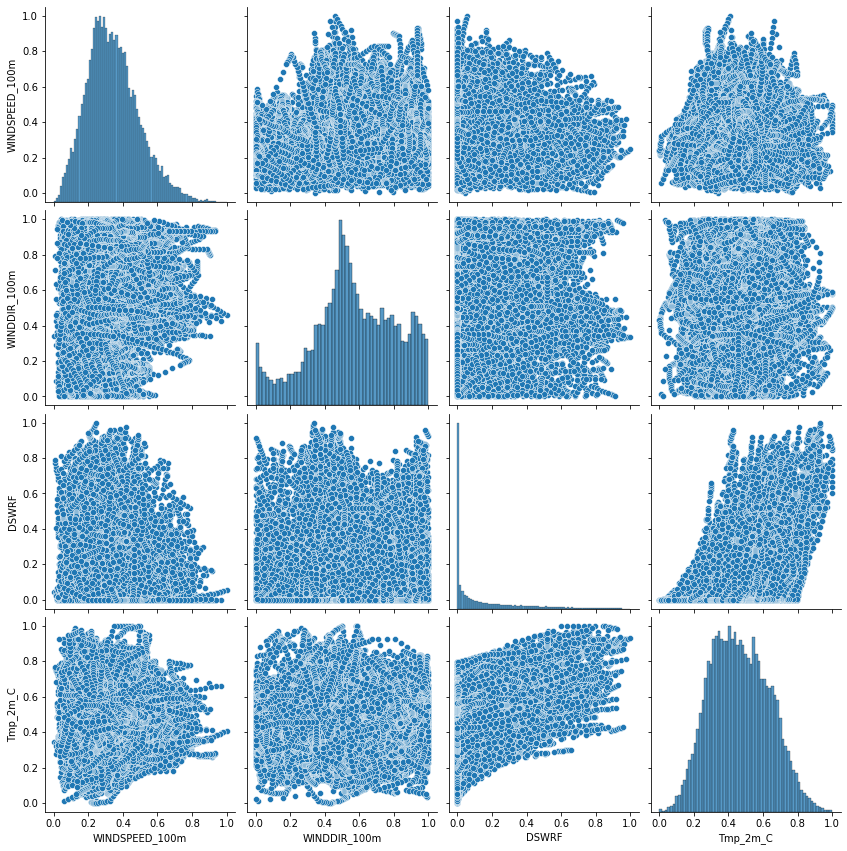

In [12]:
#variables = ['obs_power_wind', 'obs_power_solar', 'obs_power_agr']+list(features[:4])
variables = list(features[:4])

fig_pairplot = sns.pairplot(df[variables], height = 3)
fig_pairplot.savefig(f"{path_out_data_processing}/{plant}_pairplot_meteo_features.pdf") 

# Statistics for models

In [13]:
stats_wind = calculate_metric_horizon_windows(df_preds_wind, 'nrmse', [48]).sort_values(by=[48])
stats_wind.to_csv(f"{path_out_predictions}/{plant}_nrmse_all_horizons_wind.csv" , sep = ";")
stats_wind

,48
Y_pred_RF(full day),0.086873
Y_pred_LGB(static),0.114290
Y_pred_LSTM(full day),0.119865
Y_pred_RF(static),0.123420
Y_pred_LR(static),0.126794
Y_pred_LGB(dynamic),0.135651
Y_pred_LR(dynamic),0.148375
Y_pred_RF(dynamic),0.153287
Y_pred_PST,0.226128


In [14]:
stats_solar = calculate_metric_horizon_windows(df_preds_solar, 'nrmse', [48]).sort_values(by=[48])
stats_solar.to_csv(f"{path_out_predictions}/{plant}_nrmse_all_horizons_solar.csv" , sep = ";")
stats_solar

,48
Y_pred_RF(full day),0.080950
Y_pred_LGB(static),0.088061
Y_pred_LSTM(full day),0.089337
Y_pred_LR(static),0.093542
Y_pred_RF(static),0.093926
Y_pred_RF(dynamic),0.113905
Y_pred_LR(dynamic),0.129170
Y_pred_PST,0.139269
Y_pred_LGB(dynamic),0.176635


In [15]:
stats_agr = calculate_metric_horizon_windows(df_preds_agr, 'nrmse', [48]).sort_values(by=[48])
stats_agr.to_csv(f"{path_out_predictions}/{plant}_nrmse_all_horizons_agr.csv" , sep = ";")
stats_agr

,48
Y_pred_RF(full day),0.071613
Y_pred_LGB(static),0.087785
Y_pred_LSTM(full day),0.089058
Y_pred_RF(static),0.094296
Y_pred_LR(static),0.096406
Y_pred_LGB(dynamic),0.101915
Y_pred_LR(dynamic),0.121789
Y_pred_RF(dynamic),0.121900
Y_pred_PST,0.200522


In [16]:
stats_agr_sum = calculate_metric_horizon_windows(df_preds_agr_sum, 'nrmse', [48]).sort_values(by=[48])
stats_agr_sum.to_csv(f"{path_out_predictions}/{plant}_nrmse_all_horizons_agr_sum.csv" , sep = ";")
stats_agr_sum

,48
Y_pred_RF(full day),0.072889
Y_pred_LGB(static),0.086531
Y_pred_LSTM(full day),0.089549
Y_pred_RF(static),0.091897
Y_pred_LR(static),0.095610
Y_pred_RF(dynamic),0.108672
Y_pred_LR(dynamic),0.120283
Y_pred_LGB(dynamic),0.135780
Y_pred_PST,0.148868


# Plot test day for wind + solar + aggregate

In [17]:
idx = 10
plot_variables = ['Y_pred_LSTM(full day)', 'Y_pred_RF(full day)', 'Y_pred_LGB(static)', 'Y_true', 'Horizon']

In [18]:
fig_day_wind = plot_test_day(df_preds_wind[plot_variables], idx = idx, width = 600, height = 600, title = "")
fig_day_wind.write_image(f"{path_out_predictions}/{plant}_DAH_test_day_wind.pdf", width=720, height=720)
fig_day_wind.show()

In [19]:
fig_day_solar = plot_test_day(df_preds_solar[plot_variables], idx = idx, width = 600, height = 600, title = "")
fig_day_solar.write_image(f"{path_out_predictions}/{plant}_DAH_test_day_solar.pdf", width=720, height=720)
fig_day_solar.show()

In [20]:
fig_day_agr = plot_test_day(df_preds_agr[plot_variables], idx = idx, width = 600, height = 600, title = "")
fig_day_agr.write_image(f"{path_out_predictions}/{plant}_DAH_test_day_agr.pdf", width=720, height=720)
fig_day_agr.show()

In [21]:
fig_day_agr_sum = plot_test_day(df_preds_agr_sum[plot_variables], idx = idx, width = 600, height = 600, title = "")
fig_day_agr_sum.write_image(f"{path_out_predictions}/{plant}_DAH_test_day_agr_sum.pdf", width=720, height=720)
fig_day_agr_sum.show()

# Plot horizon plots

In [22]:
df_preds_agr_sum.columns = [x + "_sum" for x in df_preds_agr_sum.columns]
df_preds_agr_sum = df_preds_agr_sum.drop(['Horizon_sum'], axis=1)
df_agr_models = pd.concat([df_preds_agr, df_preds_agr_sum], axis=1)

In [23]:
# We manually adjust these plots a bit for some plants
#models = ['Y_pred_LSTM(full day)', 'Y_pred_RF(full day)', 'Y_pred_LGB(static)', 'Y_pred_PST']
models = ['Y_pred_LSTM(full day)', 'Y_pred_RF(full day)', 'Y_pred_LGB(static)']
#if plant == 'Nazeerabad':
#    fig_horizon_solar = plot_horizons(df_preds_solar, 'nrmse', models, vline = 0, title = "", plot_solar = True, plot_solar_range = [14, 35])
#elif plant == 'HPP3':
#    fig_horizon_solar = plot_horizons(df_preds_solar, 'nrmse', models, vline = 0, title = "", plot_solar = True, plot_solar_range = [11, 37])
#else:
#    fig_horizon_solar = plot_horizons(df_preds_solar, 'nrmse', models, vline = 0, title = "", plot_solar = True)
fig_horizon_solar = plot_horizons(df_preds_solar, 'rmse', models, vline = 0, title = "")
fig_horizon_solar.write_image(f"{path_out_predictions}/{plant}_horizon_errors_solar.pdf", width=1080, height=720)
fig_horizon_solar.show()

In [24]:
models = ['Y_pred_LSTM(full day)', 'Y_pred_RF(full day)', 'Y_pred_LGB(static)']
fig_horizon_wind = plot_horizons(df_preds_wind, 'nrmse', models, vline = 0, title = "")
fig_horizon_wind.write_image(f"{path_out_predictions}/{plant}_horizon_errors_wind.pdf", width=1080, height=720)
fig_horizon_wind.show()

In [25]:
models = ['Y_pred_LSTM(full day)', 'Y_pred_LSTM(full day)_sum', 'Y_pred_RF(dynamic)', 'Y_pred_RF(dynamic)_sum', 'Y_pred_PST']
#models = ['Y_pred_LSTM(full day)', 'Y_pred_RF(full day)', 'Y_pred_LGB(static)', 'Y_pred_PST']
#models = ['Y_pred_LSTM(full day)', 'Y_pred_RF(full day)', 'Y_pred_LGB(static)', 'Y_pred_PST', 'Y_pred_LSTM(full day)_sum', 'Y_pred_RF(full day)_sum', 'Y_pred_LGB(static)_sum']
models = ['Y_pred_LSTM(full day)', 'Y_pred_RF(full day)', 'Y_pred_LGB(static)']
fig_horizon_agr = plot_horizons(df_agr_models, 'nrmse', models, vline = 0, title = "")
fig_horizon_agr.write_image(f"{path_out_predictions}/{plant}_horizon_errors_agr.pdf", width=1080, height=720)
fig_horizon_agr.show()

# Ridge plots

In [26]:
fig_ridge = plot_ridges_multiple_models(df_agr_models, ['Y_pred_LSTM(full day)', 'Y_pred_LSTM(full day)_sum', 'Y_pred_PST'])
fig_ridge.write_image(f"{path_out_predictions}/{plant}_ridgeplot_LSTM_agr_sum.pdf", width=1080, height=720)
fig_ridge.show()

C:\Users\Garsdal\Anaconda3\envs\env\lib\site-packages\pandas\core\indexing.py:1667: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



# Violin plots

In [27]:
horizons = [0, 5, 11, 17, 23, 29, 35, 41, 47]
fig_violins = plot_violins_multiple_models(df_agr_models, ['Y_pred_LSTM(full day)', 'Y_pred_LSTM(full day)_sum'], horizons)
fig_violins.write_image(f"{path_out_predictions}/{plant}_violinplot_LSTM_agr_sum.pdf", width=1080, height=720)
fig_violins.show()